#**1. Import packages and load the data.**

In [ ]:
!pip install pyLDAvis
import nltk
nltk.download('punkt')
from nltk import sent_tokenize,word_tokenize
from nltk import regexp_tokenize
from nltk.corpus import stopwords
from nltk.corpus import wordnet

import matplotlib.pyplot as plt
import gensim
import spacy

from gensim.models import CoherenceModel, LdaModel, LsiModel, HdpModel
from gensim.models.wrappers import LdaMallet
from gensim.corpora import Dictionary
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()

import os, re, operator, warnings
warnings.filterwarnings('ignore')
%matplotlib inline

nltk.download('stopwords')
nltk.download('wordnet')

!pip install pandas==1.2
import pandas as pd
!pip install numpy==1.20.1
import numpy as np

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_lda.py:29: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  EPS = np.finfo(np.float).eps


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#**2. Tidy the data.**

##**2.1 Aggregate the data into a single dataframe.**

In [ ]:
# Set default values.
month = ['jan','feb','march','april','may']
year = ['2017','2018']
df_list = []

for i in year:
  for j in month:
    if i == '2018' and j == 'May':
      break
    str1 = 'article_'+j+'_'+i
    df_list.append(str1)

for i in df_list:
  print(i)

article_jan_2017
article_feb_2017
article_march_2017
article_april_2017
article_may_2017
article_jan_2018
article_feb_2018
article_march_2018
article_april_2018
article_may_2018


In [ ]:
# Update dataframe of article data.
def update_df(df,month,year):
  str1 = '/content/drive/MyDrive/NYT COMMENTS/'+df
  print(str1)
  df = pd.read_csv(str1)
  df['Month'] = pd.Series([month for x in range(len(df.index))])
  df['Year'] = pd.Series([year for x in range(len(df.index))])
  return df

article_jan_2017 = update_df('ArticlesJan2017.csv','Jan','2017')
article_feb_2017 = update_df('ArticlesFeb2017.csv','Feb','2017')
article_march_2017 = update_df('ArticlesMarch2017.csv','March','2017')
article_april_2017 = update_df('ArticlesApril2017.csv','April','2017')
article_may_2017 = update_df('ArticlesMay2017.csv','May','2017')
article_jan_2018 = update_df('ArticlesJan2018.csv','Jan','2018')
article_feb_2018 = update_df('ArticlesFeb2018.csv','Feb','2018')
article_march_2018 = update_df('ArticlesMarch2018.csv','March','2018')
article_april_2018 = update_df('ArticlesApril2018.csv','April','2018')

frames = [article_jan_2017,article_feb_2017,article_march_2017,article_april_2017,article_may_2017,
          article_jan_2018,article_feb_2018,article_march_2018,article_april_2018]

article_df = pd.concat(frames)
article_df['Month'].value_counts()
print('Length of the dataframe: {}'.format(len(article_df)))

/content/drive/MyDrive/NYT COMMENTS/ArticlesJan2017.csv
/content/drive/MyDrive/NYT COMMENTS/ArticlesFeb2017.csv
/content/drive/MyDrive/NYT COMMENTS/ArticlesMarch2017.csv
/content/drive/MyDrive/NYT COMMENTS/ArticlesApril2017.csv
/content/drive/MyDrive/NYT COMMENTS/ArticlesMay2017.csv
/content/drive/MyDrive/NYT COMMENTS/ArticlesJan2018.csv
/content/drive/MyDrive/NYT COMMENTS/ArticlesFeb2018.csv
/content/drive/MyDrive/NYT COMMENTS/ArticlesMarch2018.csv
/content/drive/MyDrive/NYT COMMENTS/ArticlesApril2018.csv
Length of the dataframe: 9335


In [43]:
# Update dataframe.
comment_feb_2018 = update_df('CommentsFeb2018.csv','Feb','2018')

frames = [comment_feb_2018]

comment_f2018 = pd.concat(frames)
comment_f2018['Month'].value_counts()
comment_f2018['Year'].value_counts()
print('Length of the dataframe: {}'.format(len(comment_f2018)))

/content/drive/MyDrive/NYT COMMENTS/CommentsFeb2018.csv
Length of the dataframe: 39969


In [ ]:
# Update dataframe of comments data.
def update_df(df,month,year):
  str1 = '/content/drive/MyDrive/NYT COMMENTS/'+df
  print(str1)
  df = pd.read_csv(str1,error_bad_lines=False, engine="python")
  df['Month'] = pd.Series([month for x in range(len(df.index))])
  df['Year'] = pd.Series([year for x in range(len(df.index))])
  return df

comment_jan_2017 = update_df('CommentsJan2017.csv','Jan','2017')
comment_feb_2017 = update_df('CommentsFeb2017.csv','Feb','2017')
comment_march_2017 = update_df('CommentsMarch2017.csv','March','2017')
comment_april_2017 = update_df('CommentsApril2017.csv','April','2017')
comment_may_2017 = update_df('CommentsMay2017.csv','May','2017')
comment_jan_2018 = update_df('CommentsJan2018.csv','Jan','2018')
comment_feb_2018 = update_df('CommentsFeb2018.csv','Feb','2018')
comment_march_2018 = update_df('CommentsMarch2018.csv','March','2018')
comment_april_2018 = update_df('CommentsApril2018.csv','April','2018')

frames = [comment_jan_2017,comment_feb_2017,comment_march_2017,comment_april_2017,comment_may_2017,
          comment_jan_2018,comment_feb_2018,comment_march_2018,comment_april_2018]

comment_df = pd.concat(frames)
comment_df['Month'].value_counts()
comment_df['Year'].value_counts()
print('Length of the dataframe: {}'.format(len(comment_df)))
# article_df = pd.read_csv('/content/drive/MyDrive/NYT COMMENTS/ArticlesApril2017.csv')

/content/drive/MyDrive/NYT COMMENTS/CommentsJan2017.csv


Skipping line 21997: unexpected end of data


/content/drive/MyDrive/NYT COMMENTS/CommentsFeb2017.csv


Skipping line 21918: unexpected end of data


/content/drive/MyDrive/NYT COMMENTS/CommentsMarch2017.csv


Skipping line 26902: unexpected end of data
Skipping line 13524: Expected 34 fields in line 13524, saw 44


/content/drive/MyDrive/NYT COMMENTS/CommentsApril2017.csv
/content/drive/MyDrive/NYT COMMENTS/CommentsMay2017.csv


Skipping line 3431: unexpected end of data
Skipping line 23448: unexpected end of data


/content/drive/MyDrive/NYT COMMENTS/CommentsJan2018.csv
/content/drive/MyDrive/NYT COMMENTS/CommentsFeb2018.csv


Skipping line 3015: unexpected end of data


/content/drive/MyDrive/NYT COMMENTS/CommentsMarch2018.csv


Skipping line 25582: unexpected end of data


/content/drive/MyDrive/NYT COMMENTS/CommentsApril2018.csv


Skipping line 13398: Expected 34 fields in line 13398, saw 36


Length of the dataframe: 204806


##**2.2 Remove irrelevant characters.**

In [ ]:
# Remove irrelevant characters.
import re
import string

def dataframe_clean(text):
   
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub('\n', '', text)
    return text

abc = lambda x: dataframe_clean(x)

article_data_clean_headline = pd.DataFrame(article_df['headline'].apply(abc))
article_data_clean_snippet = pd.DataFrame(article_df['snippet'].apply(abc))
article = pd.concat([article_data_clean_headline, article_data_clean_snippet], axis=1)

print(article.head())

                                            headline                                            snippet
0     gop leadership poised to topple obamas pillars  the most powerful and ambitious republicanled ...
1  fractured world tested the hope of a young pre...  a strategy that went from a good war to the sh...
2                               little troublemakers             chuck deodene puts us in a bubbly mood
3                  angela merkel russias next target  with a friend entering the white house vladimi...
4                      boots for a stranger on a bus     witnessing an act of generosity on a rainy day


In [ ]:
#Take only the characters we are interest in and drop NaN data points.
comment_df = comment_df.loc[:,["Month","articleID", "parentID", "commentBody", "commentID", "articleWordCount", "userDisplayName", "userID"]]
comment_df = comment_df.dropna()
comment_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 201322 entries, 0 to 38557
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Month             201322 non-null  object 
 1   articleID         201322 non-null  object 
 2   parentID          201322 non-null  float64
 3   commentBody       201322 non-null  object 
 4   commentID         201322 non-null  float64
 5   articleWordCount  201322 non-null  float64
 6   userDisplayName   201322 non-null  object 
 7   userID            201322 non-null  float64
dtypes: float64(4), object(4)
memory usage: 13.8+ MB


In [44]:
comment_f2018 = comment_f2018.loc[:,["Month","Year","articleID", "parentID", "commentBody", "commentID", "articleWordCount", "userDisplayName", "userID"]]
comment_f2018 = comment_f2018.dropna()
comment_f2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39960 entries, 0 to 39967
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Month             39960 non-null  object 
 1   Year              39960 non-null  object 
 2   articleID         39960 non-null  object 
 3   parentID          39960 non-null  float64
 4   commentBody       39960 non-null  object 
 5   commentID         39960 non-null  float64
 6   articleWordCount  39960 non-null  float64
 7   userDisplayName   39960 non-null  object 
 8   userID            39960 non-null  float64
dtypes: float64(4), object(5)
memory usage: 3.0+ MB


In [ ]:
# Remove irrelevant characters.
import re
import string

def dataframe_clean(text):
   
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub('\n', '', text)
    return text

abc = lambda x: dataframe_clean(x)

comment = pd.DataFrame(comment_f2018['commentBody'].apply(abc))

print(comment.head())

                                         commentBody
0  the snakefilled heads comment made me think of...
1                        shedevil reporting for duty
2                    xx is the new mark of the devil
3  courtland sykes should be writing for the onio...
4  i happen to descend for a few of them because ...


##**2.3 Create corpus and generate tokens.**

In [ ]:
# Create headline corpus and snippet corpus.
corpus_headline = []
corpus_snippet = []
for i,j in zip(article['headline'],article['snippet']):
    corpus_headline.append(i)
    corpus_snippet.append(j)
    
print(corpus_headline)
print(corpus_snippet)

[' gop leadership poised to topple obamas pillars', 'fractured world tested the hope of a young president', 'little troublemakers', 'angela merkel russias next target', 'boots for a stranger on a bus', 'molder of navajo youth where a game is sacred', 'the affair season  episode  noah goes home', 'sprint and mr trumps fictional jobs', 'america  becomes a stan', 'fighting diabetes and leading by example', 'chinese court says mr c was fired unjustifiably', 'cold therapy maybe better save your money', 'shunned stars of steroid era are on deck for cooperstown', 'picking up a personal thread at an office party', 'health reform could outlast repeal efforts', 'mr trump bureaucracy apprentice', 'house gop votes to gut an office reviewing ethics', 'right to disconnect from work email and other laws go into effect in france', 'lessons from the tea party', 'all talk', 'unknown', 'winter comforts', 'the snapchat presidency', 'unknown', 'the house at the end of the world', 'power down', 'fraud cultu

In [ ]:
# Generate tokens for both columns.
from tqdm import tqdm
# from tqdm.notebook import tqdm
article_clean = article
import spacy
nlp = spacy.load('en')

def generate_tokens(df,column):
  skl_text = []
  line = []
  for i in tqdm(df[column]):
    doc = nlp(i.lower())
    for word in doc:
        if (word.text != '\n' and not word.is_stop and not word.is_punct and not word.is_digit and word.text != '\r' and len(word)>2 ):
            line.append(word.lemma_)
    skl_text.append(line)
    line = []
  return skl_text

article_clean['headline_tokens'] = generate_tokens(article_clean,'headline')
article_clean['snippet_tokens'] = generate_tokens(article_clean,'snippet')

print(article_clean.head())

100%|██████████| 9335/9335 [01:50<00:00, 84.24it/s]

                                            headline  ...                                     snippet_tokens
0     gop leadership poised to topple obamas pillars  ...  [powerful, ambitious, republicanle, congress, ...
1  fractured world tested the hope of a young pre...  ...  [strategy, go, good, war, shorthand, afghan, g...
2                               little troublemakers  ...                [chuck, deodene, put, bubbly, mood]
3                  angela merkel russias next target  ...  [friend, enter, white, house, vladimir, putin,...
4                      boots for a stranger on a bus  ...             [witness, act, generosity, rainy, day]

[5 rows x 4 columns]


In [ ]:
corpus_headline = []
corpus_snippet = []
for i,j in zip(article['headline'],article['snippet']):
    corpus_headline.append(i)
    corpus_snippet.append(j)
comment_clean = comment

comment_clean['body_tokens'] = generate_tokens(comment_clean,'commentBody')

print(comment_clean.head())

100%|██████████| 39960/39960 [13:23<00:00, 49.71it/s]

                                         commentBody                                        body_tokens
0  the snakefilled heads comment made me think of...  [snakefilled, head, comment, think, medusa, br...
1                        shedevil reporting for duty                        [shedevil, reporting, duty]
2                    xx is the new mark of the devil                                 [new, mark, devil]
3  courtland sykes should be writing for the onio...      [courtland, sykes, write, onion, run, office]
4  i happen to descend for a few of them because ...  [happen, descend, nasty, woman, like, roam, pa...


##**2.4 Remove stop words.**

In [ ]:
# Filter stop words and check the lenth.
stopp =stopwords.words('english')
mostf = ['unknown','day','good','trump','new','question','season','president','say']
for i in mostf:
  stopp.append(i)
article_clean['headline_tokens'] = article_clean['headline_tokens'].apply(lambda x: [item for item in (x) if item not in stopp and len(item) >2])
article_clean['snippet_tokens'] = article_clean['snippet_tokens'].apply(lambda x: [item for item in (x) if item not in stopp and len(item) >2])
print(article_clean.head())

print('Lenth of original: {}'.format(len(article_df)))
print('Lenth of now: {}'.format(len(article_clean)))

# Create date columns.
month = article_df['Month'].to_list()
year = article_df['Year'].to_list()
article_clean['Month'] = month
article_clean['Year'] = year

                                            headline  ...                                     snippet_tokens
0     gop leadership poised to topple obamas pillars  ...  [powerful, ambitious, republicanle, congress, ...
1  fractured world tested the hope of a young pre...  ...  [strategy, war, shorthand, afghan, reflect, co...
2                               little troublemakers  ...                [chuck, deodene, put, bubbly, mood]
3                  angela merkel russias next target  ...  [friend, enter, white, house, vladimir, putin,...
4                      boots for a stranger on a bus  ...                  [witness, act, generosity, rainy]

[5 rows x 4 columns]
Lenth of original: 9335
Lenth of now: 9335


In [ ]:
# Filter stop words and check the lenth.
stopp =stopwords.words('english')
mostf = ['unknown','day','good','trump','new','question','season','president','say']
for i in mostf:
  stopp.append(i)
comment_clean['body_tokens'] = comment_clean['body_tokens'].apply(lambda x: [item for item in (x) if item not in stopp and len(item) >2])
print(comment_clean.head())

print('Lenth of original: {}'.format(len(comment_f2018)))
print('Lenth of now: {}'.format(len(comment_clean)))

                                         commentBody                                        body_tokens
0  the snakefilled heads comment made me think of...  [snakefilled, head, comment, think, medusa, br...
1                        shedevil reporting for duty                        [shedevil, reporting, duty]
2                    xx is the new mark of the devil                                      [mark, devil]
3  courtland sykes should be writing for the onio...      [courtland, sykes, write, onion, run, office]
4  i happen to descend for a few of them because ...  [happen, descend, nasty, woman, like, roam, pa...
Lenth of original: 39960
Lenth of now: 39960


In [ ]:
comment_df

,Month,articleID,parentID,commentBody,commentID,articleWordCount,userDisplayName,userID
0,Jan,58691a5795d0e039260788b9,0.0,For all you Americans out there --- still rejo...,20969730.0,1324.0,N. Smith,64679318.0
1,Jan,58691a5795d0e039260788b9,0.0,Obamas policies may prove to be the least of t...,20969325.0,1324.0,Kilocharlie,69254188.0
2,Jan,58691a5795d0e039260788b9,0.0,Democrats are comprised of malcontents who gen...,20969855.0,1324.0,Frank Fryer,76788711.0
3,Jan,58691a5795d0e039260788b9,0.0,The picture in this article is the face of con...,20969407.0,1324.0,James Young,72718862.0
4,Jan,58691a5795d0e039260788b9,0.0,Elections have consequences.,20969274.0,1324.0,M.,7529267.0
...,...,...,...,...,...,...,...,...
38553,April,5ad86523068401528a2a9889,26792923.0,"Poverty is personal, cultural, and structural....",26796285.0,2380.0,cheddarcheese,75750501.0
38554,April,5ad86523068401528a2a9889,26792923.0,Yes the ethos now is: you're not ripping off t...,26798794.0,2380.0,mattiaw,27330344.0
38555,April,5ad86523068401528a2a9889,26792923.0,This is what I believe a true democrat believes.,26800984.0,2380.0,Meagan,67138344.0
38556,April,5ad86523068401528a2a9889,26792871.0,"""make men and women equal in every minute deta...",26799262.0,2380.0,Naomi,67454483.0


In [ ]:
article_df

,articleID,abstract,byline,documentType,headline,keywords,multimedia,newDesk,printPage,pubDate,sectionName,snippet,source,typeOfMaterial,webURL,articleWordCount,Month,Year
0,58691a5795d0e039260788b9,NaN,By JENNIFER STEINHAUER,article,G.O.P. Leadership Poised to Topple Obama’s Pi...,"['United States Politics and Government', 'Law...",1,National,1,2017-01-01 15:03:38,Politics,The most powerful and ambitious Republican-led...,The New York Times,News,https://www.nytimes.com/2017/01/01/us/politics...,1324,Jan,2017
1,586967bf95d0e03926078915,NaN,By MARK LANDLER,article,Fractured World Tested the Hope of a Young Pre...,"['Obama, Barack', 'Afghanistan', 'United State...",1,Foreign,1,2017-01-01 20:34:00,Asia Pacific,A strategy that went from a “good war” to the ...,The New York Times,News,https://www.nytimes.com/2017/01/01/world/asia/...,2836,Jan,2017
2,58698a1095d0e0392607894a,NaN,By CAITLIN LOVINGER,article,Little Troublemakers,"['Crossword Puzzles', 'Boxing Day', 'Holidays ...",1,Games,0,2017-01-01 23:00:24,Unknown,Chuck Deodene puts us in a bubbly mood.,The New York Times,News,https://www.nytimes.com/2017/01/01/crosswords/...,445,Jan,2017
3,5869911a95d0e0392607894e,NaN,By JOCHEN BITTNER,article,"Angela Merkel, Russia’s Next Target","['Cyberwarfare and Defense', 'Presidential Ele...",1,OpEd,15,2017-01-01 23:30:27,Unknown,"With a friend entering the White House, Vladim...",The New York Times,Op-Ed,https://www.nytimes.com/2017/01/01/opinion/ang...,864,Jan,2017
4,5869a61795d0e03926078962,NaN,By JIAYIN SHEN,article,Boots for a Stranger on a Bus,"['Shoes and Boots', 'Buses', 'New York City']",0,Metro,12,2017-01-02 01:00:02,Unknown,Witnessing an act of generosity on a rainy day.,The New York Times,Brief,https://www.nytimes.com/2017/01/01/nyregion/me...,309,Jan,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1319,5ae82c93068401528a2ab969,NaN,By CLAIRE CAIN MILLER,article,This Common Question Reinforces the Gender Pay...,"['Discrimination', 'Wages and Salaries', 'Labo...",68,Upshot,3,2018-05-01 09:00:01,Unknown,Several states and cities have ordered employe...,The New York Times,News,https://www.nytimes.com/2018/05/01/upshot/how-...,1004,April,2018
1320,5ae82c95068401528a2ab96b,NaN,By TRACY J. GATES,article,"Anna, Llama and Me","['Friendship', 'Dewdney, Anna', 'Writing and W...",65,Well,0,2018-05-01 09:00:02,Family,"The beginning, middle and end of a picture boo...",The New York Times,News,https://www.nytimes.com/2018/05/01/well/family...,1043,April,2018
1321,5ae82c9d068401528a2ab96d,NaN,Interview by AUDIE CORNISH,article,Gen. Michael Hayden Has One Regret: Russia,"['Classified Information and State Secrets', '...",66,Magazine,70,2018-05-01 09:00:06,Unknown,"The former N.S.A. and C.I.A. chief on Trump, S...",The New York Times,News,https://www.nytimes.com/2018/05/01/magazine/ge...,659,April,2018
1322,5ae82c9f068401528a2ab96f,NaN,By JASON ROBERT BROWN,article,There Is Nothin’ Like a Tune,"['Books and Literature', 'Purdum, Todd S', 'Th...",68,BookReview,17,2018-05-01 09:00:07,Book Review,"In “Something Wonderful,” Todd S. Purdum analy...",The New York Times,Review,https://www.nytimes.com/2018/05/01/books/revie...,1155,April,2018


In [45]:
# Create date columns.
month = comment_f2018['Month'].to_list()
year = comment_f2018['Year'].to_list()
comment_clean['Month'] = month
comment_clean['Year'] = year

#**3. Visualize the cleaned data.**

In [46]:
# Create convenience functions to generate word cloud images.
!pip install wordcloud
from wordcloud import WordCloud
from PIL import Image
# cand_mask = np.array(Image.open('/content/trump3.jpeg'))
# cand_mask=np.where(cand_mask > 19, 255, cand_mask)

def get_df(df,month,year):
  result_df = df.loc[df['Month']==month] 
  result_df = result_df.loc[result_df['Year']==year] 
  return result_df


def generate_wordcloud(df,column,string):
  all_list = []

  for i in df[column]:
      for j in i:
          all_list.append(j)
          
  all_string = ', '.join(all_list)

  wc = WordCloud(stopwords=stopp, background_color="black", colormap='Set3',
                 contour_color='red',contour_width=1,
                max_font_size=150, random_state=42)
  import matplotlib.pyplot as plt

  plt.rcParams['figure.figsize'] = [16, 6]
  wc.generate(all_string)
  plt.imshow(wc)
  plt.axis("off")
  plt.title(string)

  plt.show()

##**3.1 Create word cloud.**

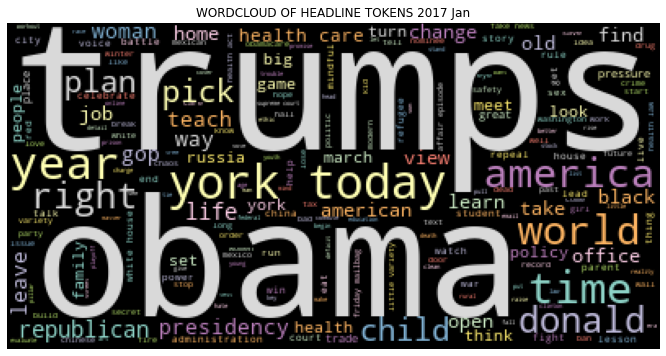

In [47]:
article_2017_jan = get_df(article_clean,'Jan','2017')
generate_wordcloud(article_2017_jan,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2017 Jan')

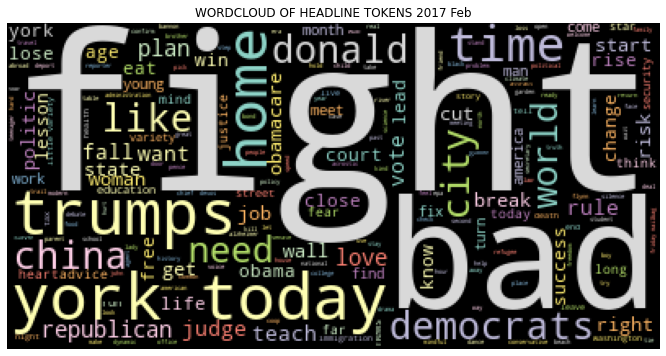

In [48]:
article_2017_feb = get_df(article_clean,'Feb','2017')
generate_wordcloud(article_2017_feb,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2017 Feb')

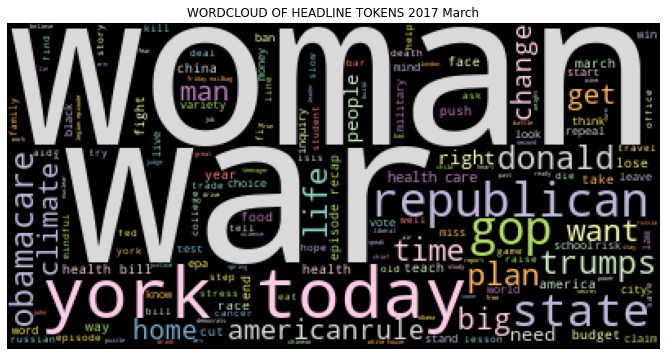

In [49]:
article_2017_march = get_df(article_clean,'March','2017')
generate_wordcloud(article_2017_march,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2017 March')

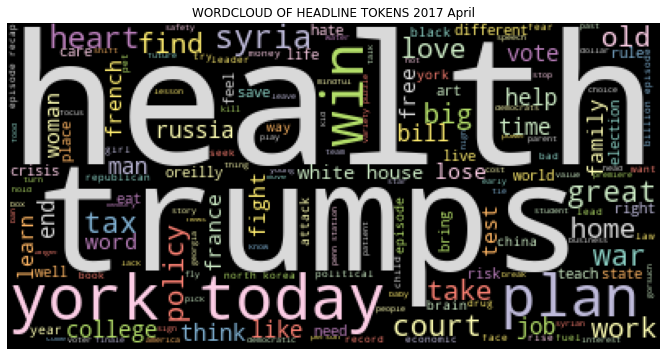

In [50]:
article_2017_april = get_df(article_clean,'April','2017')
generate_wordcloud(article_2017_april,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2017 April')

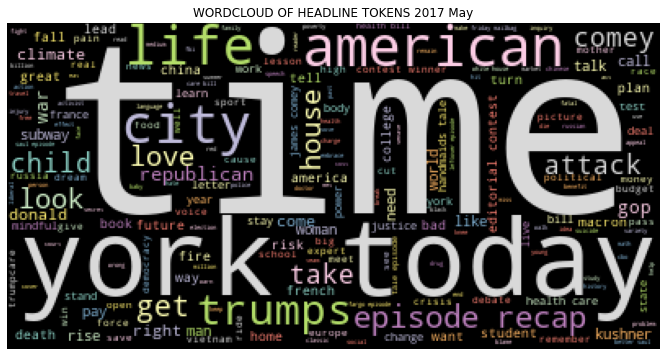

In [51]:
article_2017_may = get_df(article_clean,'May','2017')
generate_wordcloud(article_2017_may,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2017 May')

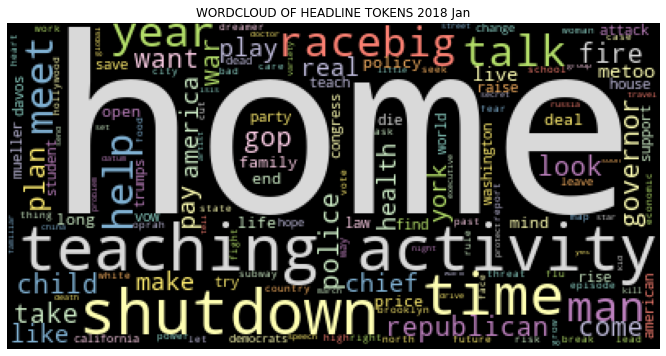

In [52]:
article_2018_jan = get_df(article_clean,'Jan','2018')
generate_wordcloud(article_2018_jan,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2018 Jan')

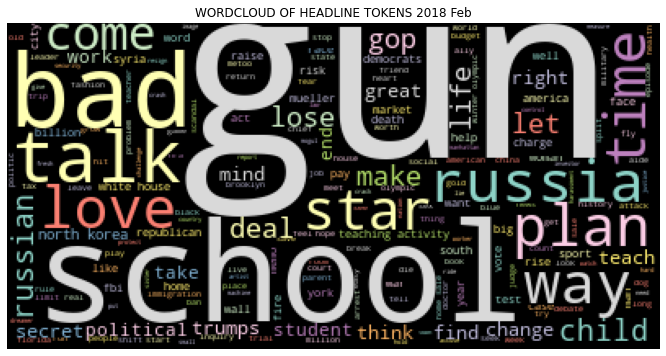

In [53]:
article_2018_feb = get_df(article_clean,'Feb','2018')
generate_wordcloud(article_2018_feb,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2018 Feb')

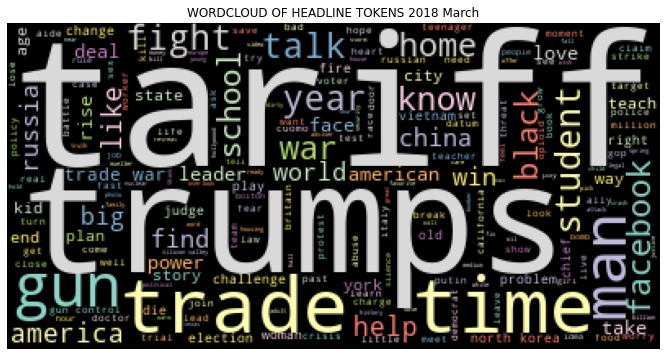

In [54]:
article_2018_march = get_df(article_clean,'March','2018')
generate_wordcloud(article_2018_march,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2018 March')

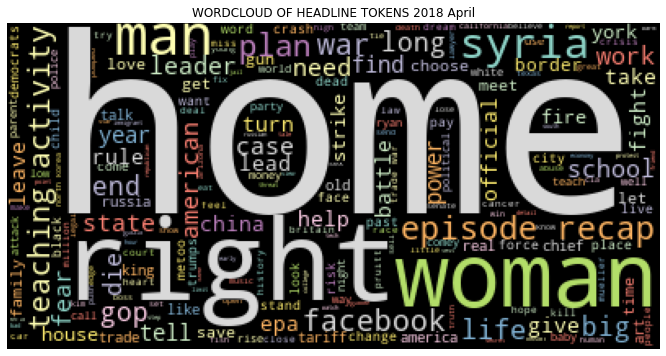

In [55]:
article_2018_april = get_df(article_clean,'April','2018')
generate_wordcloud(article_2018_april,'headline_tokens','WORDCLOUD OF HEADLINE TOKENS 2018 April')

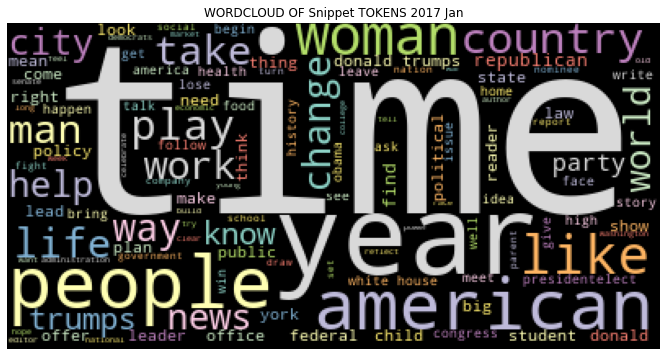

In [56]:
generate_wordcloud(article_2017_jan,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2017 Jan')

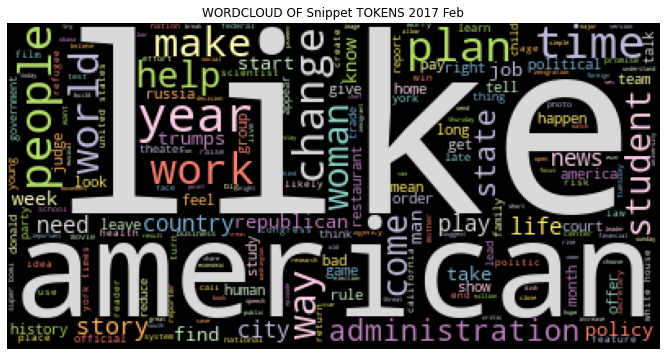

In [57]:
generate_wordcloud(article_2017_feb,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2017 Feb')

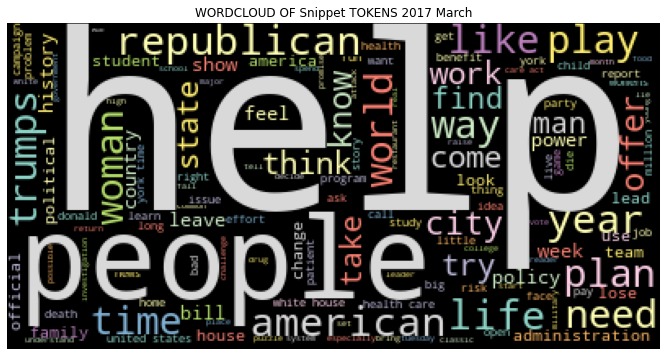

In [58]:
generate_wordcloud(article_2017_march,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2017 March')

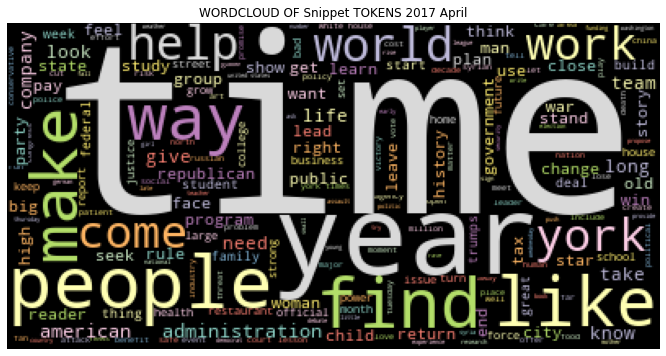

In [59]:
generate_wordcloud(article_2017_april,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2017 April')

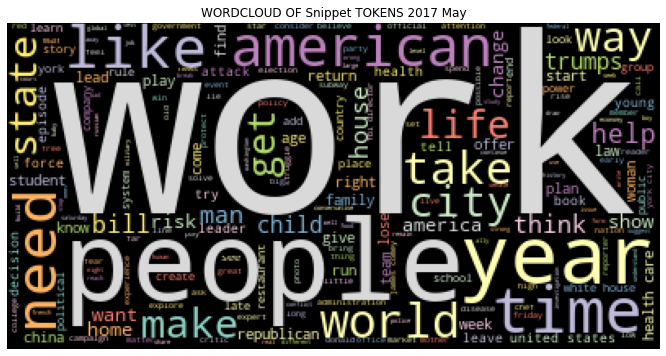

In [60]:
generate_wordcloud(article_2017_may,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2017 May')

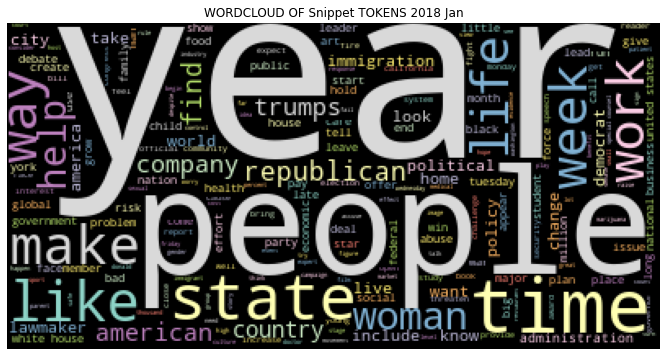

In [61]:
generate_wordcloud(article_2018_jan,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2018 Jan')

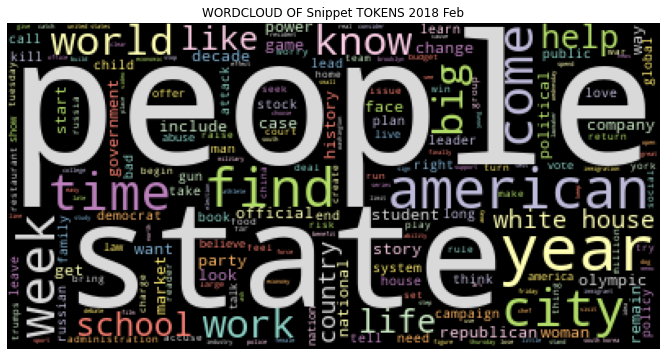

In [62]:
generate_wordcloud(article_2018_feb,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2018 Feb')

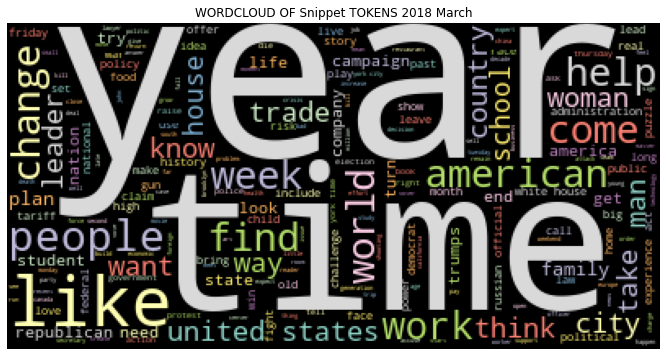

In [63]:
generate_wordcloud(article_2018_march,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2018 March')

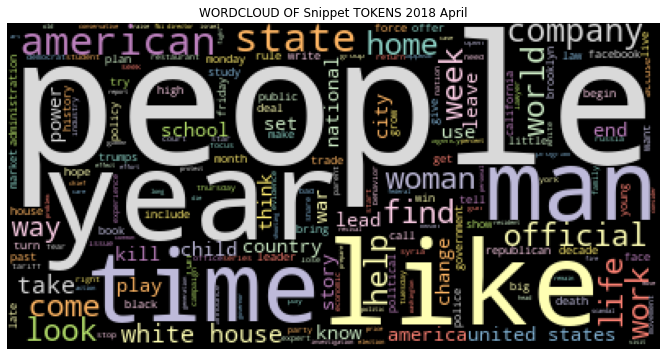

In [64]:
generate_wordcloud(article_2018_april,'snippet_tokens','WORDCLOUD OF Snippet TOKENS 2018 April')

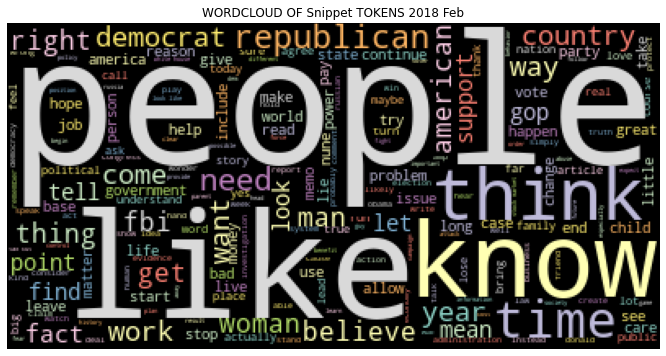

In [65]:
comment_2018_feb = comment_clean
generate_wordcloud(comment_2018_feb,'body_tokens','WORDCLOUD OF Snippet TOKENS 2018 Feb')

#**4. Sentiment analysis.**

##**4.1 Visualize the distribution of polarity and subjectivity.**

In [66]:
!pip install textblob
from textblob import TextBlob

In [67]:
polar = lambda x : TextBlob(x).sentiment.polarity
subject = lambda x : TextBlob(x).sentiment.subjectivity

article_clean['polarity_headlines'] = article_clean['headline'].apply(polar)
article_clean['subjectivity_headlines'] = article_clean['headline'].apply(subject)
article_clean['polarity_snippet'] = article_clean['snippet'].apply(polar)
article_clean['subjectivity_snippet'] = article_clean['snippet'].apply(subject)

print(article_clean.head())

                                            headline  ... subjectivity_snippet
0     gop leadership poised to topple obamas pillars  ...             0.466667
1  fractured world tested the hope of a young pre...  ...             0.675000
2                               little troublemakers  ...             0.000000
3                  angela merkel russias next target  ...             0.500000
4                      boots for a stranger on a bus  ...             0.000000

[5 rows x 10 columns]


In [68]:
comment_clean['polarity_body'] = comment_clean['commentBody'].apply(polar)
comment_clean['subjectivity_body'] = comment_clean['commentBody'].apply(subject)

print(comment_clean.head())

                                         commentBody  ... subjectivity_body
0  the snakefilled heads comment made me think of...  ...          0.100000
1                        shedevil reporting for duty  ...          0.000000
2                    xx is the new mark of the devil  ...          0.454545
3  courtland sykes should be writing for the onio...  ...          0.000000
4  i happen to descend for a few of them because ...  ...          0.490000

[5 rows x 6 columns]


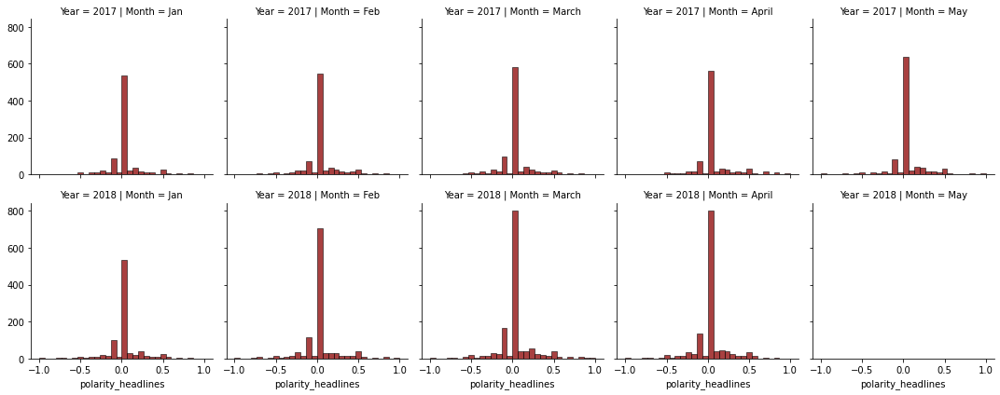

In [69]:
# Visualize the distribution.
import seaborn as sns
g = sns.FacetGrid(article_clean, col="Month",  row="Year")
g.map_dataframe(sns.histplot, "polarity_headlines", bins=30, color = 'darkred')

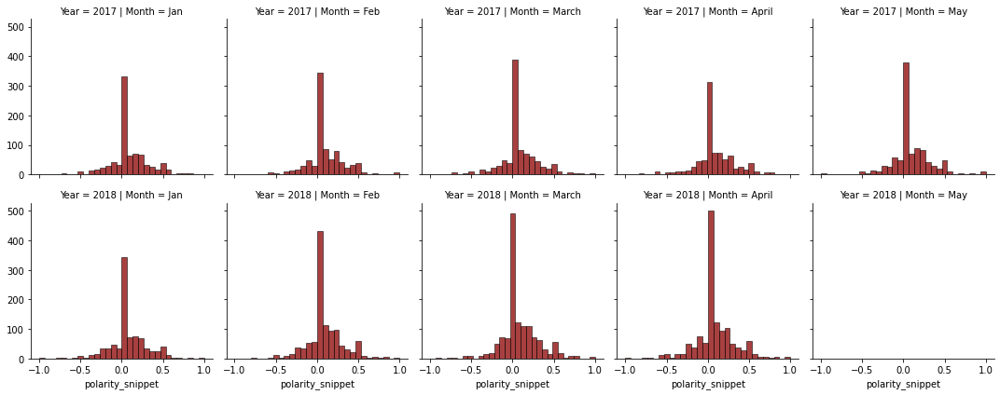

In [70]:
g = sns.FacetGrid(article_clean, col="Month",  row="Year")
g.map_dataframe(sns.histplot, "polarity_snippet",bins=int(30), color = 'darkred')

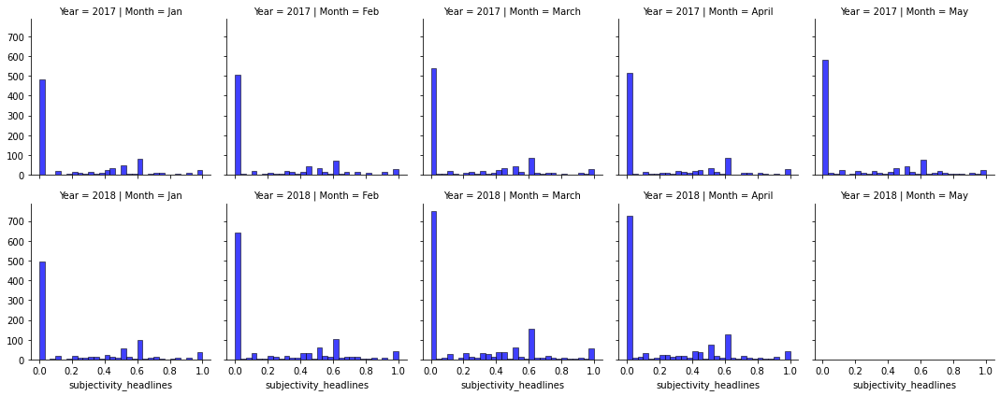

In [71]:
g = sns.FacetGrid(article_clean, col="Month",  row="Year")
g.map_dataframe(sns.histplot, "subjectivity_headlines", bins=30, color = 'b')

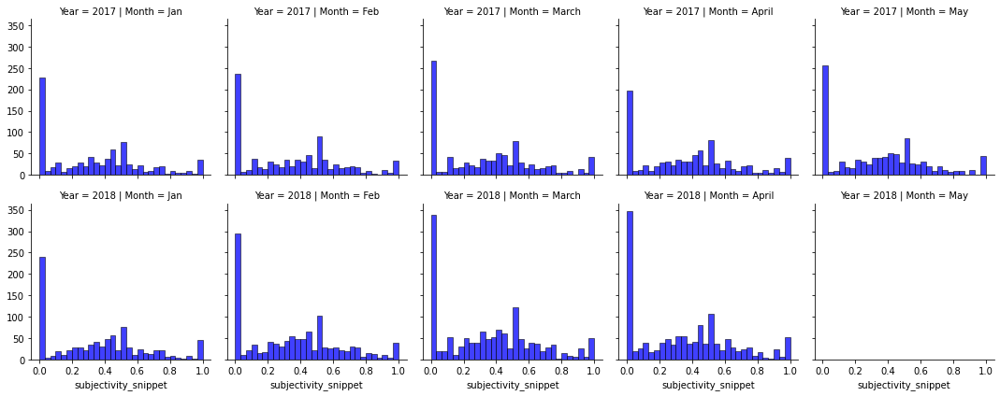

In [72]:
g = sns.FacetGrid(article_clean, col="Month",  row="Year")
g.map_dataframe(sns.histplot, "subjectivity_snippet", bins=30, color = 'b')

##**4.3 Sentiment anaglysis for comments.**

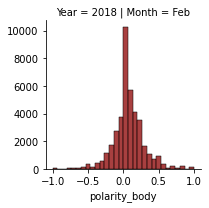

In [73]:
g = sns.FacetGrid(comment_clean, col="Month",  row="Year")
g.map_dataframe(sns.histplot, "polarity_body", bins=30, color = 'darkred')

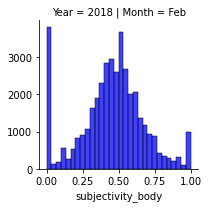

In [74]:
g = sns.FacetGrid(comment_clean, col="Month",  row="Year")
g.map_dataframe(sns.histplot, "subjectivity_body", bins=30, color = 'b')

##**4.2 Calculate the average of polarity and subjectivity for all articles.**

In [75]:
def averageOfList(num):
    sumOfNumbers = 0
    for t in num:
        sumOfNumbers = sumOfNumbers + t

    avg = sumOfNumbers / len(num)
    return avg

print('Average polarity for headlines: {}'.format(averageOfList(article_clean['polarity_headlines'])))
print('Average polarity for snippet: {}'.format(averageOfList(article_clean['polarity_snippet'])))
print('Average subjectivity for headlines: {}'.format(averageOfList(article_clean['subjectivity_headlines'])))
print('Average subjectivity for snippet: {}'.format(averageOfList(article_clean['subjectivity_snippet'])))

Average polarity for headlines: 0.01796028643785755
Average polarity for snippet: 0.07589992085179957
Average subjectivity for headlines: 0.22655886549077192
Average subjectivity for snippet: 0.34633081509422464


**It seems the average polarity is natural. The average subjectivity appears to be objective.**

#**5. LDA analysis.**

In [76]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from sklearn.decomposition import LatentDirichletAllocation
from gensim import matutils, models
import scipy.sparse

##**5.1 Create convinient functions.**

In [77]:
def data_prepare_topic(df,column):
  bigram = gensim.models.Phrases(df[column])
  texts = [bigram[line] for line in df[column]]

  dictionary = Dictionary(texts)
  corpus = [dictionary.doc2bow(text) for text in texts]
  lsimodel = LsiModel(corpus=corpus, num_topics=10, id2word=dictionary)

  lsimodel.show_topics(num_topics=5)
  
  lsimodel.show_topics(num_topics=5)
  return corpus, dictionary


def show_topics(df,column):

  no_features = 1000

  tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
  tfidf = tfidf_vectorizer.fit_transform(df[column])
  tfidf_feature_names = tfidf_vectorizer.get_feature_names()

  tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
  tf = tf_vectorizer.fit_transform(df[column])

  tf_feature_names = tf_vectorizer.get_feature_names()

  no_topics = 10

  # Run LDA
  lda1 = models.LdaModel(corpus = corpus,id2word= dictionary,num_topics=5, passes=200)

  no_top_words = 10
  return lda1,corpus,dictionary

##**5.2 Apply these functions to do LDA analysis and visualize topic distributions.**

In [78]:
corpus, dictionary = data_prepare_topic(article_2017_jan,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_jan,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.066563 -0.132476       1        1  23.161999
4      0.096831 -0.023047       2        1  20.382876
3     -0.100554  0.085416       3        1  19.346237
1      0.003700  0.042385       4        1  18.707041
0      0.066585  0.027721       5        1  18.401846, topic_info=        Term      Freq     Total Category  logprob  loglift
9      world  7.000000  7.000000  Default  30.0000  30.0000
69     house  7.000000  7.000000  Default  29.0000  29.0000
162     time  7.000000  7.000000  Default  28.0000  28.0000
94      year  9.000000  9.000000  Default  27.0000  27.0000
33   america  7.000000  7.000000  Default  26.0000  26.0000
..       ...       ...       ...      ...      ...      ...
20      game  1.358926  4.370895   Topic5  -5.9827   0.5244
944      ban  1.357856  3.126018   Topic5  -5.9834   0.8589
439     stop  1.357591  3.092169   Topic5  -5.9836   0.8696
107      eye  1.357541  3.120463   Topic5  -5.9837   0.8604
219      age  1.357338  2.500727   Topic5  -5.9838   1.0817

[293 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
137       5  0.539076        acrostic
1243      2  0.533572         address
1191      1  0.782806  administration
1191      2  0.260935  administration
25        2  0.802847          affair
...     ...       ...             ...
95        3  0.187579      york_today
95        4  0.281368      york_today
95        5  0.093789      york_today
10        1  0.398601           young
10        3  0.398601           young

[432 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 5, 4, 2, 1])

In [79]:
corpus, dictionary = data_prepare_topic(article_2017_feb,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_feb,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.117006  0.024781       1        1  22.037102
0      0.090265  0.092606       2        1  21.003509
1      0.015602 -0.123743       3        1  19.897802
4      0.060577 -0.029220       4        1  18.941620
2     -0.049439  0.035576       5        1  18.119967, topic_info=          Term      Freq     Total Category  logprob  loglift
260        bad  8.000000  8.000000  Default  30.0000  30.0000
69        fall  5.000000  5.000000  Default  29.0000  29.0000
21      trumps  8.000000  8.000000  Default  28.0000  28.0000
214     little  4.000000  4.000000  Default  27.0000  27.0000
118  democrats  6.000000  6.000000  Default  26.0000  26.0000
..         ...       ...       ...      ...      ...      ...
178        era  1.348051  3.103677   Topic5  -6.0039   0.8742
888     russia  1.347746  2.478563   Topic5  -6.0041   1.0989
632       step  1.347043  2.481215   Topic5  -6.0046   1.0973
235       free  1.346651  4.385057   Topic5  -6.0049   0.5276
176    success  1.346596  4.382414   Topic5  -6.0050   0.5281

[295 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
230       4  0.811635        acrostic
494       2  0.529422          action
217       1  0.399441  administration
217       3  0.399441  administration
130       3  0.803086          advice
...     ...       ...             ...
11        4  0.114030      york_today
11        5  0.114030      york_today
491       1  0.678644           young
491       2  0.226215           young
491       3  0.226215           young

[438 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 2, 5, 3])

In [80]:
corpus, dictionary = data_prepare_topic(article_2017_march,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_march,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.128029  0.018354       1        1  21.643867
1     -0.110997  0.045982       2        1  20.187255
2     -0.002998 -0.008740       3        1  20.139531
3     -0.018217 -0.132157       4        1  19.551117
0      0.004183  0.076561       5        1  18.478230, topic_info=         Term       Freq      Total Category  logprob  loglift
493      life   8.000000   8.000000  Default  30.0000  30.0000
193   episode  11.000000  11.000000  Default  29.0000  29.0000
50        man   6.000000   6.000000  Default  28.0000  28.0000
240      need   6.000000   6.000000  Default  27.0000  27.0000
478      news   5.000000   5.000000  Default  26.0000  26.0000
..        ...        ...        ...      ...      ...      ...
160       war   2.000117  10.174958   Topic5  -5.7373   0.0619
497     party   1.381879   2.527883   Topic5  -6.1071   1.0846
129  baseball   1.381134   2.519327   Topic5  -6.1076   1.0875
589     money   1.382317   4.430496   Topic5  -6.1068   0.5238
438    people   1.381110   6.356556   Topic5  -6.1076   0.1620

[304 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
418       1  0.521384    acrostic
961       2  0.262273         aid
961       3  0.262273         aid
961       4  0.524545         aid
806       4  0.526126        aide
...     ...       ...         ...
720       4  0.261611        york
134       1  0.587601  york_today
134       3  0.097934  york_today
134       4  0.293801  york_today
704       3  0.523235        zero

[475 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 2, 3, 4, 1])

In [81]:
corpus, dictionary = data_prepare_topic(article_2017_april,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_april,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.121439  0.064874       1        1  23.012549
1     -0.030999 -0.111015       2        1  20.013924
4      0.113177  0.048006       3        1  19.755447
0      0.027034 -0.065742       4        1  19.588751
3      0.012227  0.063876       5        1  17.629329, topic_info=            Term       Freq      Total Category  logprob  loglift
437          war   6.000000   6.000000  Default  30.0000  30.0000
240        great   6.000000   6.000000  Default  29.0000  29.0000
145   york_today   9.000000   9.000000  Default  28.0000  28.0000
86       episode  12.000000  12.000000  Default  27.0000  27.0000
217        court   7.000000   7.000000  Default  26.0000  26.0000
...          ...        ...        ...      ...      ...      ...
277    political   1.342695   3.708221   Topic5  -6.0403   0.7197
1191    internet   1.342603   2.483429   Topic5  -6.0404   1.1206
143         turn   1.342358   3.107982   Topic5  -6.0406   0.8961
133         news   1.342021   4.961857   Topic5  -6.0408   0.4280
1072         law   1.341937   3.717446   Topic5  -6.0409   0.7167

[287 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
35        1  0.785220    acrostic
585       3  0.401639         air
585       4  0.401639         air
604       1  0.524891   airstrike
1283      5  0.542721     america
...     ...       ...         ...
183       1  0.528974        york
183       4  0.264487        york
183       5  0.264487        york
145       1  0.837037  york_today
145       3  0.104630  york_today

[435 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 5, 1, 4])

In [82]:
corpus, dictionary = data_prepare_topic(article_2017_may,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_may,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.095703  0.069109       1        1  22.362112
3     -0.007909  0.078335       2        1  21.161875
2      0.065624 -0.118330       3        1  19.714871
1     -0.109426 -0.007489       4        1  18.553692
4     -0.043992 -0.021626       5        1  18.207449, topic_info=            Term      Freq     Total Category  logprob  loglift
281        comey  7.000000  7.000000  Default  30.0000  30.0000
832       donald  6.000000  6.000000  Default  29.0000  29.0000
511  republicans  5.000000  5.000000  Default  28.0000  28.0000
197          gop  6.000000  6.000000  Default  27.0000  27.0000
128         work  4.000000  4.000000  Default  26.0000  26.0000
..           ...       ...       ...      ...      ...      ...
133          war  1.996939  6.967081   Topic5  -5.8075   0.4538
426         look  1.996130  8.200943   Topic5  -5.8079   0.2903
421     disaster  1.376004  2.505233   Topic5  -6.1800   1.1041
371         save  1.380308  3.804340   Topic5  -6.1768   0.6895
429      problem  1.376949  3.158470   Topic5  -6.1793   0.8731

[302 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1112      4  0.531568    acrostic
346       5  0.798140         add
1343      2  0.518567       agent
129       1  0.467818    american
129       3  0.155939    american
...     ...       ...         ...
47        4  0.450120        york
174       2  0.176895  york_today
174       3  0.176895  york_today
174       4  0.442237  york_today
174       5  0.176895  york_today

[464 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 3, 2, 5])

In [83]:
corpus, dictionary = data_prepare_topic(article_2018_jan,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2018_jan,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.110063 -0.019282       1        1  21.357732
2      0.028699 -0.122476       2        1  21.008470
3     -0.048641  0.083303       3        1  20.385391
4      0.100527  0.052377       4        1  19.997708
0      0.029478  0.006079       5        1  17.250699, topic_info=         Term      Freq     Total Category  logprob  loglift
795    change  4.000000  4.000000  Default  30.0000  30.0000
530      want  5.000000  5.000000  Default  29.0000  29.0000
287    family  4.000000  4.000000  Default  28.0000  28.0000
546    trumps  6.000000  6.000000  Default  27.0000  27.0000
702      life  5.000000  5.000000  Default  26.0000  26.0000
..        ...       ...       ...      ...      ...      ...
537      find  1.333587  4.348540   Topic5  -6.0706   0.5753
471      race  1.333386  6.911917   Topic5  -6.0708   0.1118
4       woman  1.333237  3.747491   Topic5  -6.0709   0.7238
6    congress  1.333231  4.366795   Topic5  -6.0709   0.5709
213    artist  1.333117  3.102582   Topic5  -6.0710   0.9126

[302 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
760       5  0.811861  addictive
21        5  0.819161     africa
235       3  0.531922        air
39        1  0.787531      alert
64        3  0.797912   alliance
...     ...       ...        ...
547       3  0.397674       year
547       4  0.132558       year
547       5  0.132558       year
202       3  0.598011       york
202       4  0.199337       york

[460 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 4, 5, 1])

In [84]:
corpus, dictionary = data_prepare_topic(article_2018_feb,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2018_feb,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.075899 -0.113487       1        1  21.092741
3      0.080831  0.108619       2        1  20.280176
0     -0.088132  0.031282       3        1  20.022227
4      0.018254  0.002822       4        1  19.637553
2     -0.086852 -0.029236       5        1  18.967303, topic_info=        Term       Freq      Total Category  logprob  loglift
53    school   9.000000   9.000000  Default  30.0000  30.0000
1118     gun  12.000000  12.000000  Default  29.0000  29.0000
675      way   9.000000   9.000000  Default  28.0000  28.0000
505     race   7.000000   7.000000  Default  27.0000  27.0000
688    child   8.000000   8.000000  Default  26.0000  26.0000
...      ...        ...        ...      ...      ...      ...
264     love   2.386619   8.366808   Topic5  -5.8786   0.4081
362    court   2.037486   5.780773   Topic5  -6.0368   0.6196
538     city   2.037562   5.790509   Topic5  -6.0367   0.6180
371     help   2.040300   6.443090   Topic5  -6.0354   0.5125
7       find   2.042059   7.053288   Topic5  -6.0345   0.4229

[323 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
893       1  0.309229     abuse
893       3  0.618458     abuse
433       5  0.521703   account
438       5  0.521702  acrostic
201       1  0.464604       act
...     ...       ...       ...
249       4  0.581744      year
130       1  0.172740      york
130       2  0.172740      york
130       4  0.345479      york
130       5  0.172740      york

[537 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 4, 1, 5, 3])

In [85]:
corpus, dictionary = data_prepare_topic(article_2018_march,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2018_march,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.102198  0.076887       1        1  20.722258
0     -0.116499  0.077481       2        1  20.568885
1      0.043260 -0.088139       3        1  20.290660
3     -0.049597 -0.090389       4        1  19.214022
4      0.020638  0.024160       5        1  19.204176, topic_info=           Term      Freq      Total Category  logprob  loglift
490       world  8.000000   8.000000  Default  30.0000  30.0000
337   trade_war  7.000000   7.000000  Default  29.0000  29.0000
18        house  9.000000   9.000000  Default  28.0000  28.0000
9         judge  6.000000   6.000000  Default  27.0000  27.0000
175        york  6.000000   6.000000  Default  26.0000  26.0000
..          ...       ...        ...      ...      ...      ...
104       fight  3.387457  10.505051   Topic5  -5.7170   0.5183
812  california  2.743457   5.894392   Topic5  -5.9278   0.8853
27        trade  3.540591  13.143931   Topic5  -5.6728   0.3384
145         old  2.745394   6.566000   Topic5  -5.9271   0.7781
227        find  2.738776   8.549561   Topic5  -5.9295   0.5117

[331 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
417       5  0.765830  acrostic
921       1  0.756818  activism
113       1  0.138456       age
113       3  0.415367       age
113       4  0.276911       age
...     ...       ...       ...
147       3  0.189805      year
147       5  0.189805      year
609       4  0.613519       yes
609       5  0.306760       yes
175       3  0.909163      york

[549 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 2, 4, 5])

In [86]:
corpus, dictionary = data_prepare_topic(article_2018_april,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2018_april,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.060014  0.024316       1        1  21.173217
1      0.025940 -0.050344       2        1  20.618100
0     -0.072361 -0.103732       3        1  20.253732
2     -0.100207  0.101159       4        1  20.164509
3      0.086614  0.028601       5        1  17.790442, topic_info=         Term       Freq      Total Category  logprob  loglift
357       man  11.000000  11.000000  Default  30.0000  30.0000
354     woman  11.000000  11.000000  Default  29.0000  29.0000
345     house   9.000000   9.000000  Default  28.0000  28.0000
277      lead   7.000000   7.000000  Default  27.0000  27.0000
50      right  12.000000  12.000000  Default  26.0000  26.0000
..        ...        ...        ...      ...      ...      ...
178      help   2.059471   7.171624   Topic5  -6.1170   0.4788
338  facebook   2.055674   9.824475   Topic5  -6.1189   0.1622
235      tell   2.055402   7.847636   Topic5  -6.1190   0.3868
524     chief   2.054323   5.859490   Topic5  -6.1195   0.6784
629    strike   2.053462   7.183268   Topic5  -6.1199   0.4743

[335 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
2244      4  0.508567    abroad
869       3  0.509710    access
679       2  0.762916  acrostic
1265      4  0.309502    action
1265      5  0.619004    action
...     ...       ...       ...
403       1  0.305339      york
403       3  0.458009      york
403       5  0.152670      york
979       2  0.218335     young
979       3  0.655005     young

[558 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 2, 1, 3, 4])

#**6. Comments analysis.**

In [ ]:
count_comments_person = comment_df.loc[:,'userDisplayName'].value_counts() 
mostcommon_person = count_comments_person[count_comments_person > 100]
mostcommon_person

In [ ]:
df5 = mostcommon_person.nlargest(20)
df5 = df5.to_frame()
df5 = df5.reset_index()
df5 = df5.rename(columns={'index': 'Name'})
df5 = df5.rename(columns={'userDisplayName': 'Count'})
df5

In [ ]:
import seaborn as sns
fig,ax=plt.subplots(figsize=(12,8))
ax = sns.barplot(data=df5,x='Name',y='Count')
plt.xticks(rotation=70)
plt.title('Count for comments')

In [ ]:
count_comments = comment_df.loc[:,'articleID'].value_counts()  
mostcommon_article = count_comments.idxmax() 
max_common_article = article_df[article_df['articleID']==mostcommon_article]
print('The most article gets the most comments is:',max_common_article['headline'].unique())

In [ ]:
top_count_comments = count_comments[count_comments > 3000]
print('The famous article (articles get more than 3000 comments) are:')
for i in top_count_comments.index:
  more_common_article = article_df[article_df['articleID'] == i]
  title = more_common_article['headline'].unique()
  print(title[0],"with number of comments: ", top_count_comments[i])

In [ ]:
key_words_df = {}
for aID in count_comments.index:
  temp = article_df[article_df['articleID'] == aID]
  key_words_list = temp["keywords"].unique()
  key_words_list.tolist()
  if key_words_list != []:
    for word in key_words_list:
      if word not in key_words_df.keys():
        key_words_df[word] = count_comments[aID]
      else:
        key_words_df[word] += count_comments[aID]
key_words_df = [key_words_df]
key_words_df = pd.DataFrame(key_words_df).T
key_words_df = key_words_df.reset_index()
key_words_df.columns = ["keyword","n_comments"]
key_words_df = key_words_df.sort_values(by=['n_comments'],ascending=False)
key_words_df['keyword'] = key_words_df['keyword'].str.replace(r'[', '')
key_words_df['keyword'] = key_words_df['keyword'].str.replace(r']', '')
key_words_df

In [ ]:
plt.pie(key_words_df.iloc[:20].n_comments, labels = key_words_df.iloc[:20].keyword, counterclock = False, wedgeprops = {'width' : 0.5});

**# 7. Topic Modeling**

#**7. Topic Modeling.**

In [94]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from sklearn.decomposition import LatentDirichletAllocation
from gensim import matutils, models
import scipy.sparse

In [95]:
def data_prepare_topic(df,column):
  bigram = gensim.models.Phrases(df[column])
  texts = [bigram[line] for line in df[column]]



  dictionary = Dictionary(texts)
  print(dictionary.items())
  corpus = [dictionary.doc2bow(text) for text in texts]
  lsimodel = LsiModel(corpus=corpus, num_topics=10, id2word=dictionary)

  lsimodel.show_topics(num_topics=5)
  

  lsimodel.show_topics(num_topics=5)
  return corpus, dictionary

In [96]:
def show_topics(df,column):

  no_features = 1000

  tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
  tfidf = tfidf_vectorizer.fit_transform(df[column])
  tfidf_feature_names = tfidf_vectorizer.get_feature_names()

  tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
  tf = tf_vectorizer.fit_transform(df[column])

  tf_feature_names = tf_vectorizer.get_feature_names()

  no_topics = 10

  # Run NMF
  #nmf = NMF(n_components=no_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd').fit(tfidf)

  # Run LDA
  lda1 = models.LdaModel(corpus = corpus,id2word= dictionary,num_topics=5, passes=200)
  # lda1.show_topics()

  no_top_words = 10
  return lda1,corpus,dictionary

In [97]:
corpus, dictionary = data_prepare_topic(article_2017_jan,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_jan,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f93950d5450>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.129601  0.063237       1        1  24.342235
0     -0.031111 -0.091312       2        1  19.513767
1      0.032831 -0.068815       3        1  19.413173
4     -0.043389 -0.005778       4        1  18.568720
2     -0.087932  0.102667       5        1  18.162105, topic_info=        Term       Freq      Total Category  logprob  loglift
32    trumps  15.000000  15.000000  Default  30.0000  30.0000
131  variety   5.000000   5.000000  Default  29.0000  29.0000
77     right   8.000000   8.000000  Default  28.0000  28.0000
431    march   4.000000   4.000000  Default  27.0000  27.0000
11    little   5.000000   5.000000  Default  26.0000  26.0000
..       ...        ...        ...      ...      ...      ...
58      pick   1.963784   6.234957   Topic5  -5.6014   0.5505
151    white   1.586458   6.183131   Topic5  -5.8147   0.3455
630      man   1.348841   2.465943   Topic5  -5.9770   1.1025
954      get   1.350068   3.759457   Topic5  -5.9761   0.6817
545     live   1.349008   3.771041   Topic5  -5.9769   0.6779

[289 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
1395      2  0.536338        abortion
1191      1  0.772663  administration
25        2  0.805048          affair
219       2  0.804777             age
1267      2  0.404090             air
...     ...       ...             ...
148       5  0.459685            york
95        1  0.094284      york_today
95        2  0.188568      york_today
95        3  0.565704      york_today
95        4  0.094284      york_today

[426 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 2, 5, 3])

In [98]:
# corpus, dictionary = data_prepare_topic(article_2017_feb,'headline_tokens')
# lda1,corpus,dictionary = show_topics(article_2017_feb,'headline')
# pyLDAvis.enable_notebook()
p = pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)
# p = pyLDAvis.gensim_models.prepare(topic_model, corpus, dictionary)
pyLDAvis.save_html(p, 'lda.html')
from google.colab import files
files.download('lda.html') 

# %%HTML
# <iframe width="100%" height="500" src="http://www.jishichao.com/lda.html"></iframe>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [99]:
# !pip install streamlit
# import streamlit as st

html_string = 'lda.html'
corpus, dictionary = data_prepare_topic(article_2017_march,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_march,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f938d339e90>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.054502  0.117441       1        1  21.893101
3     -0.121065 -0.037346       2        1  21.320982
1     -0.055929  0.050225       3        1  19.725744
0      0.084811 -0.067945       4        1  18.778994
4      0.037681 -0.062376       5        1  18.281179, topic_info=               Term       Freq      Total Category  logprob  loglift
134      york_today  10.000000  10.000000  Default  30.0000  30.0000
193         episode  11.000000  11.000000  Default  29.0000  29.0000
1038  episode_recap   5.000000   5.000000  Default  28.0000  28.0000
556             gop   9.000000   9.000000  Default  27.0000  27.0000
11      republicans   5.000000   5.000000  Default  26.0000  26.0000
...             ...        ...        ...      ...      ...      ...
243         liberal   1.377593   3.159891   Topic5  -6.0995   0.8691
535             ban   1.376170   4.446577   Topic5  -6.1005   0.5265
968           death   1.376107   3.830103   Topic5  -6.1005   0.6757
189            miss   1.376018   4.408855   Topic5  -6.1006   0.5349
539            free   1.375881   3.140180   Topic5  -6.1007   0.8741

[294 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
82        2  0.520275       abroad
418       3  0.526215     acrostic
322       1  0.771475       advice
1136      2  0.520275  afghanistan
816       2  0.520275          age
...     ...       ...          ...
56        5  0.532749         year
720       1  0.260195         york
720       2  0.520390         york
720       4  0.260195         york
134       2  0.972269   york_today

[450 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 2, 1, 5])

In [100]:
corpus, dictionary = data_prepare_topic(article_2017_april,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_april,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f93889eee10>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.115078  0.041653       1        1  21.007848
0     -0.072261 -0.071308       2        1  20.166291
3     -0.067104  0.031843       3        1  19.951228
1      0.053679 -0.094783       4        1  19.852911
4     -0.029392  0.092594       5        1  19.021722, topic_info=             Term       Freq      Total Category  logprob  loglift
86        episode  12.000000  12.000000  Default  30.0000  30.0000
290          like   5.000000   5.000000  Default  29.0000  29.0000
623          free   5.000000   5.000000  Default  28.0000  28.0000
890          girl   5.000000   5.000000  Default  27.0000  27.0000
250        trumps   9.000000   9.000000  Default  26.0000  26.0000
...           ...        ...        ...      ...      ...      ...
191   white_house   1.369211   4.999286   Topic5  -6.0968   0.3645
957           kid   1.364484   3.108940   Topic5  -6.1002   0.8361
163         world   1.363914   4.366964   Topic5  -6.1006   0.4959
1112     business   1.363448   3.109581   Topic5  -6.1010   0.8351
765      premiere   1.363094   3.109586   Topic5  -6.1012   0.8349

[283 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
35        1  0.792592    acrostic
63        2  0.800550         age
1469      4  0.534050        aide
585       3  0.801148         air
604       1  0.528968   airstrike
...     ...       ...         ...
145       1  0.319276  york_today
145       2  0.319276  york_today
145       3  0.106425  york_today
145       4  0.106425  york_today
145       5  0.106425  york_today

[417 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 4, 2, 5])

In [101]:
corpus, dictionary = data_prepare_topic(article_2017_may,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_may,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f938f5a4910>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.097550  0.046631       1        1  21.303229
1     -0.073592 -0.098645       2        1  21.264136
0      0.010575  0.095766       3        1  19.697413
2      0.082636 -0.066672       4        1  19.205568
4      0.077929  0.022920       5        1  18.529655, topic_info=                   Term       Freq      Total Category  logprob  loglift
26                 bill  10.000000  10.000000  Default  30.0000  30.0000
174          york_today  11.000000  11.000000  Default  29.0000  29.0000
265                 pay   5.000000   5.000000  Default  28.0000  28.0000
97               winner   5.000000   5.000000  Default  27.0000  27.0000
1395  editorial_contest   5.000000   5.000000  Default  26.0000  26.0000
...                 ...        ...        ...      ...      ...      ...
126              school   1.384857   3.809948   Topic5  -6.1911   0.6738
132             vietnam   1.384308   3.147769   Topic5  -6.1915   0.8643
257               state   1.383606   3.795717   Topic5  -6.1920   0.6766
251                face   1.383446   3.163365   Topic5  -6.1921   0.8587
18               europe   1.382849   3.780284   Topic5  -6.1925   0.6801

[296 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1112      4  0.529710    acrostic
440       1  0.517648      afford
636       4  0.529710       ahead
228       2  0.264048     america
228       4  0.528097     america
...     ...       ...         ...
706       5  0.175036       world
353       2  0.225576        year
353       4  0.676727        year
174       1  0.257815  york_today
174       2  0.687506  york_today

[448 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 2, 1, 3, 5])

In [102]:
corpus, dictionary = data_prepare_topic(article_2017_jan,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2017_jan,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f937c79a250>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.127097 -0.031003       1        1  21.987020
0      0.053014  0.092770       2        1  21.661214
4     -0.030379  0.078798       3        1  20.002788
3      0.020949 -0.084301       4        1  18.601859
1      0.083513 -0.056263       5        1  17.747119, topic_info=             Term      Freq     Total Category  logprob  loglift
33        america  7.000000  7.000000  Default  30.0000  30.0000
461   health_care  4.000000  4.000000  Default  29.0000  29.0000
523          life  6.000000  6.000000  Default  28.0000  28.0000
69          house  6.000000  6.000000  Default  27.0000  27.0000
380        people  4.000000  4.000000  Default  26.0000  26.0000
...           ...       ...       ...      ...      ...      ...
1238      protest  1.331477  2.467857   Topic5  -5.9668   1.1119
509        detail  1.331380  2.467863   Topic5  -5.9669   1.1118
234          mind  1.331371  2.446340   Topic5  -5.9669   1.1206
976         earth  1.331298  2.446341   Topic5  -5.9670   1.1205
321           tie  1.331088  2.467877   Topic5  -5.9671   1.1116

[285 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
626       1  0.529044         act
626       2  0.264522         act
626       4  0.264522         act
25        1  0.268180      affair
25        3  0.268180      affair
...     ...       ...         ...
95        4  0.283606  york_today
95        5  0.094535  york_today
24        1  0.790467       youth
846       2  0.405075        zone
846       5  0.405075        zone

[421 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 5, 4, 2])

In [103]:
corpus, dictionary = data_prepare_topic(article_2018_jan,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2018_jan,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f939d2c7910>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.105276  0.010226       1        1  21.960694
3     -0.065614 -0.035178       2        1  20.972280
2      0.068089 -0.108730       3        1  20.912405
0      0.041097  0.100790       4        1  18.825385
1      0.061704  0.032891       5        1  17.329236, topic_info=          Term      Freq     Total Category  logprob  loglift
669       meet  6.000000  6.000000  Default  30.0000  30.0000
406       mind  4.000000  4.000000  Default  29.0000  29.0000
786   shutdown  8.000000  8.000000  Default  28.0000  28.0000
276       save  4.000000  4.000000  Default  27.0000  27.0000
199       home  9.000000  9.000000  Default  26.0000  26.0000
..         ...       ...       ...      ...      ...      ...
339        kid  1.331659  3.095034   Topic5  -6.0766   0.9094
159      party  1.331450  4.362786   Topic5  -6.0768   0.5659
315  political  1.331277  2.474856   Topic5  -6.0769   1.1327
471       race  1.331082  6.904821   Topic5  -6.0771   0.1065
942       case  1.330908  3.737538   Topic5  -6.0772   0.7202

[311 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
433       3  0.527909       abuse
70        3  0.405157      action
70        5  0.405157      action
572       1  0.524146   adventure
1065      5  0.545133  affordable
...     ...       ...         ...
547       3  0.264265        year
547       4  0.264265        year
202       1  0.588330        york
202       2  0.196110        york
25        5  0.545133        zero

[476 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 3, 1, 2])

In [104]:
corpus, dictionary = data_prepare_topic(article_2018_feb,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2018_feb,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f938c559e90>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.116717  0.059116       1        1  22.975375
0     -0.025593 -0.132760       2        1  20.757499
2      0.109744  0.004775       3        1  20.717505
4      0.039975  0.073619       4        1  18.537107
3     -0.007408 -0.004750       5        1  17.012514, topic_info=                  Term      Freq     Total Category  logprob  loglift
69                 bad  9.000000  9.000000  Default  30.0000  30.0000
34             episode  8.000000  8.000000  Default  29.0000  29.0000
675                way  8.000000  8.000000  Default  28.0000  28.0000
32               death  5.000000  5.000000  Default  27.0000  27.0000
356               star  8.000000  8.000000  Default  26.0000  26.0000
..                 ...       ...       ...      ...      ...      ...
201                act  2.003019  6.425837   Topic5  -5.9451   0.6055
222             change  1.998520  6.948673   Topic5  -5.9473   0.5251
284  teaching_activity  1.999922  7.069610   Topic5  -5.9466   0.5085
550               life  2.000434  7.683322   Topic5  -5.9464   0.4255
19                plan  1.999858  8.403929   Topic5  -5.9466   0.3356

[309 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
893       2  0.924957  abuse
201       1  0.155622    act
201       2  0.311243    act
201       4  0.155622    act
201       5  0.311243    act
...     ...       ...    ...
249       4  0.193424   year
1804      1  0.506632   yoga
130       3  0.350312   york
130       5  0.525467   york
1116      1  0.757897  young

[500 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 3, 5, 4])

In [105]:
corpus, dictionary = data_prepare_topic(article_2018_march,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2018_march,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f9381fea710>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.141878  0.045139       1        1  21.623869
2      0.005551 -0.145820       2        1  21.513116
4     -0.030184  0.024679       3        1  19.966907
1     -0.074014  0.050813       4        1  19.325958
0     -0.043232  0.025189       5        1  17.570150, topic_info=        Term       Freq      Total Category  logprob  loglift
43   episode  11.000000  11.000000  Default  30.0000  30.0000
520     know   9.000000   9.000000  Default  29.0000  29.0000
527     time  10.000000  10.000000  Default  28.0000  28.0000
54     black   9.000000   9.000000  Default  27.0000  27.0000
488   leader   7.000000   7.000000  Default  26.0000  26.0000
..       ...        ...        ...      ...      ...      ...
351   change   2.054283   6.527766   Topic5  -6.1282   0.5828
18     house   2.052822   9.239175   Topic5  -6.1289   0.2347
322    right   2.052292   6.537413   Topic5  -6.1292   0.5804
33    policy   2.051542   4.578695   Topic5  -6.1295   0.9361
121    putin   2.051214   5.871140   Topic5  -6.1297   0.6874

[316 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
75        1  0.190162     abuse
75        3  0.760650     abuse
417       1  0.752237  acrostic
275       2  0.171005  activity
275       3  0.171005  activity
...     ...       ...       ...
175       3  0.454282      york
175       4  0.151427      york
1392      1  0.256601     young
1392      3  0.256601     young
1392      5  0.513203     young

[540 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 3, 5, 2, 1])

In [106]:
corpus, dictionary = data_prepare_topic(article_2018_april,'headline_tokens')
lda1,corpus,dictionary = show_topics(article_2018_april,'headline')
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda1, corpus, dictionary)

ItemsView(<gensim.corpora.dictionary.Dictionary object at 0x7f93870f7f50>)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.135926 -0.016231       1        1  20.974744
1      0.050573 -0.096845       2        1  20.510907
3      0.000173  0.112475       3        1  19.812003
0      0.006905 -0.036782       4        1  19.780454
4      0.078275  0.037383       5        1  18.921892, topic_info=              Term       Freq      Total Category  logprob  loglift
245  episode_recap  11.000000  11.000000  Default  30.0000  30.0000
378           case   8.000000   8.000000  Default  29.0000  29.0000
345          house   9.000000   9.000000  Default  28.0000  28.0000
759          white   7.000000   7.000000  Default  27.0000  27.0000
17            time   6.000000   6.000000  Default  26.0000  26.0000
..             ...        ...        ...      ...      ...      ...
615            old   2.075425   6.526331   Topic5  -6.1710   0.5192
885          dream   2.071993   5.214550   Topic5  -6.1726   0.7419
145           save   2.071322   6.524768   Topic5  -6.1729   0.5174
403           york   2.070591   6.525228   Topic5  -6.1733   0.5170
19           place   2.069840   5.869911   Topic5  -6.1737   0.6225

[325 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
2440      2  0.508632          
2345      5  0.772281    accept
1030      3  0.508755    accord
679       5  0.772281  acrostic
2172      5  0.514276       act
...     ...       ...       ...
92        4  0.635612      year
403       1  0.153251      york
403       3  0.306503      york
403       4  0.153251      york
403       5  0.306503      york

[530 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 4, 1, 5])

#**8. Knowledge Graph.**

In [119]:
!pip install spacy
!pip install networkx
!pip install requests
!pip install bs4

In [112]:
import re
import pandas as pd
import bs4
import requests
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_sm')

from spacy.matcher import Matcher 
from spacy.tokens import Span 

import networkx as nx

import matplotlib.pyplot as plt
from tqdm import tqdm

import nltk
nltk.download('punkt')

pd.set_option('display.max_colwidth', 200)
%matplotlib inline

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [113]:
def entity_extract(sent):

  ent1 = ''
  ent2 = ''

  prev_dep = ''
  prev_text = ''

  prefix = ''
  modifier = ''


  for i in nlp(sent):
    if i.dep_ != 'punct':

      #compound
      if i.dep_ == 'compound':
        prefix = i.text 
        if prev_dep == 'compound':
          prefix = prev_text + ' ' + i.text 
      
      #modifier
      if i.dep_.endswith('mod') == True:
        modifier = i.text
      if prev_dep == 'compound':
        modifier = prev_text + ' ' + i.text 



  
      if i.dep_.find('subj') == True:
        ent1 = modifier + ' '+ prefix + ' ' + i.text 
        prefix = ''
        modifier = ''
        prev_text = ''
        prev_dep = ''

      if i.dep_.find('obj') == True:
        ent2 = modifier + ' '+ prefix + ' ' + i.text 

      prev_dep = i.dep_
      prev_tok = i.text
  return [ent1.strip(),ent2.strip()]


In [115]:
article_snippet_list = []
for i in article_df['snippet']:
  article_snippet_list.append(i)

In [116]:
sentences_list = []
for i in article_snippet_list:
  a_list = nltk.tokenize.sent_tokenize(i)
  for j in a_list:
    if j is not 'Unknown':
      sentences_list.append(j)

In [117]:
for i in sentences_list:
  print(i)

Streaming output truncated to the last 5000 lines.
George S. Schuyler’s “Black No More” and Nella Larsen’s “Passing” have been reissued in time for Black History Month.
The telecommunications giant canceled a deal to sell the Mate 10 after U.S. lawmakers expressed misgivings about what they said were Huawei’s ties to the Chinese government.
The forum in Switzerland is synonymous with wealth and elite prestige, drawing leaders of nations and corporations, and some of the world’s richest individuals.
The chef at the Beatrice Inn has made her mark with luxurious old-school cooking and a management style that defies toxic restaurant culture.
They’re tiny, colorful and harmless-looking, but these little pellets are being blamed for causing big problems.
Based on the DC crime fighter, this new CW series takes on present-day issues of race and social justice directly and unambiguously.
Drenching rain sent mud roaring down the hillsides of Santa Barbara County, sweeping away houses in wildfire

In [120]:
entity_pairs = []

for i in tqdm(sentences_list):
  entity_pairs.append(entity_extract(i))

100%|██████████| 11498/11498 [02:16<00:00, 84.44it/s]


In [122]:
def get_relation(sent):

  doc = nlp(sent)

  # Matcher class object 
  matcher = Matcher(nlp.vocab)

  #define the pattern 
  pattern = [{'DEP':'ROOT'}, 
            {'DEP':'prep','OP':"?"},
            {'DEP':'agent','OP':"?"},  
            {'POS':'ADJ','OP':"?"}] 

  matcher.add("matching_1", None, pattern) 

  matches = matcher(doc)
  k = len(matches) - 1

  span = doc[matches[k][1]:matches[k][2]] 

  return(span.text)

In [123]:
relations = []

for i in tqdm(sentences_list):
  relations.append(get_relation(i))

100%|██████████| 11498/11498 [02:15<00:00, 84.96it/s]


In [124]:
print(len(entity_pairs))
print(len(relations))


11498
11498


In [125]:
source = []
target = []
for i in entity_pairs:
  source.append(i[0])
  target.append(i[1])


In [126]:
graph_df = pd.DataFrame({'source':source,'target':target,'edge':relations})
graph_df.head()

,source,target,edge
0,led Congress,law care law,plans quick
1,enough what,Afghanistan,reflects
2,Deodene Chuck Deodene,bubbly mood,puts
3,Putin Vladimir Putin,hacking Germany,turn
4,history,War Cold what,tell


In [127]:
len_s = []
len_t = []
for i in graph_df['source']:
  len_s.append(len(i))
for i in graph_df['target']:
  len_t.append(len(i))

In [128]:
graph_df['lens'] = len_s

graph_df['lent'] = len_t

In [129]:
graph_df_s = graph_df.loc[graph_df['lens']>0]
graph_df_t = graph_df_s.loc[graph_df_s['lent']>0]

graph_df_e = graph_df_t.loc[graph_df_t['edge']!='unknown']

In [130]:
graph_df_e = graph_df_e.drop(['lens','lent'],axis = 1)
graph_df_e

,source,target,edge
0,led Congress,law care law,plans quick
1,enough what,Afghanistan,reflects
2,Deodene Chuck Deodene,bubbly mood,puts
3,Putin Vladimir Putin,hacking Germany,turn
4,history,War Cold what,tell
...,...,...,...
11489,teams dog teams,soccer youth others,is
11491,Several states,history salary history,ordered
11495,people,secrets,chief on
11496,Purdum S. Purdum,brilliant songwriters,analyzes


In [131]:
G=nx.from_pandas_edgelist(graph_df_e, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

In [132]:
graph_df_e['edge'].value_counts(sort = True,ascending =False)[:20]

is          502
said        191
are         166
was         144
has         105
be          102
have         99
say          85
makes        65
found        54
think        54
says         50
had          48
’s           47
make         46
shows        46
made         45
been         44
suggests     41
need         39
Name: edge, dtype: int64

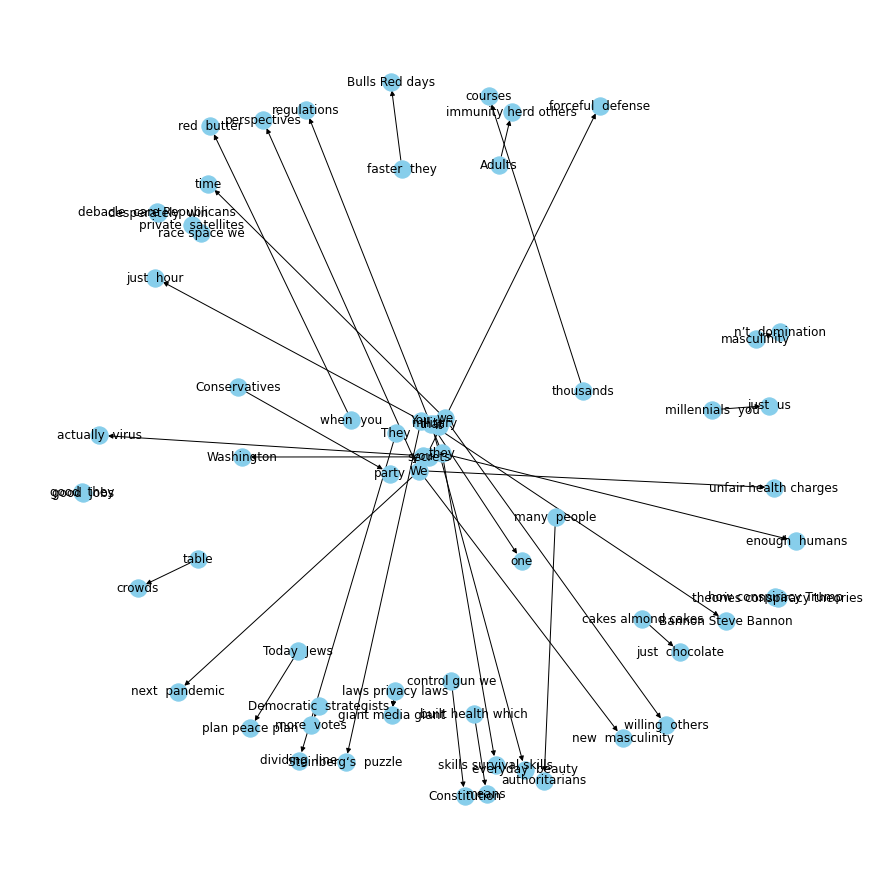

In [133]:
plt.figure(figsize=(12,12))
pos = nx.spring_layout(G)
G=nx.from_pandas_edgelist(graph_df_e[graph_df_e['edge']=='need'], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

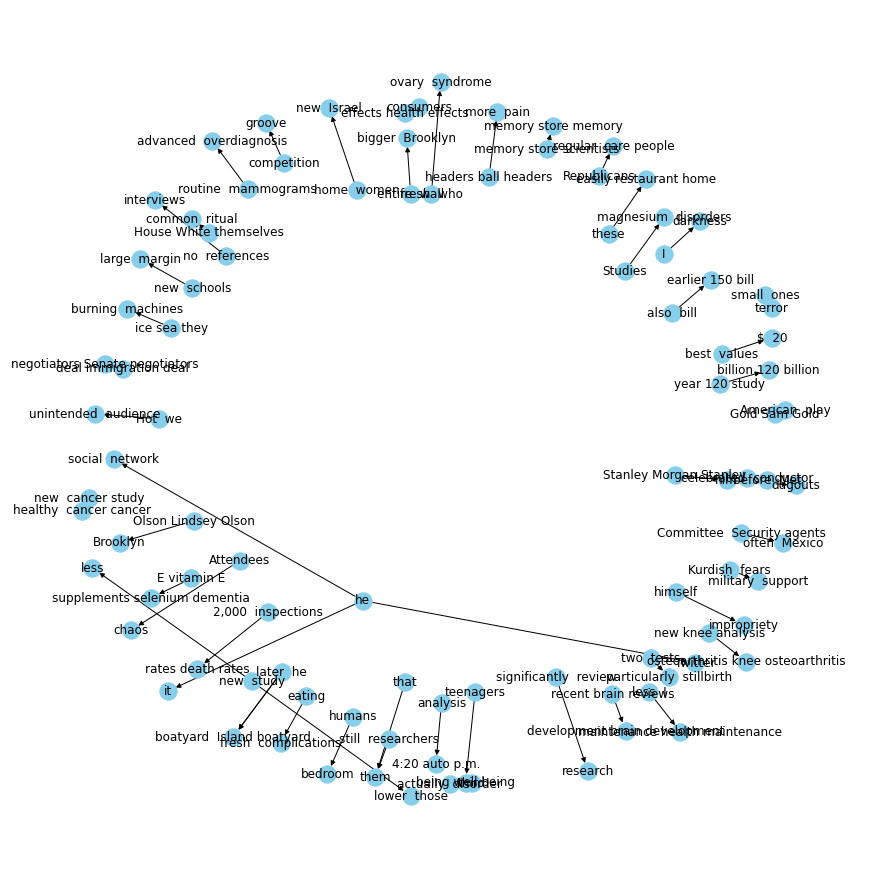

In [135]:
plt.figure(figsize=(12,12))
pos = nx.spring_layout(G)
G=nx.from_pandas_edgelist(graph_df_e[graph_df_e['edge']=='found'], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

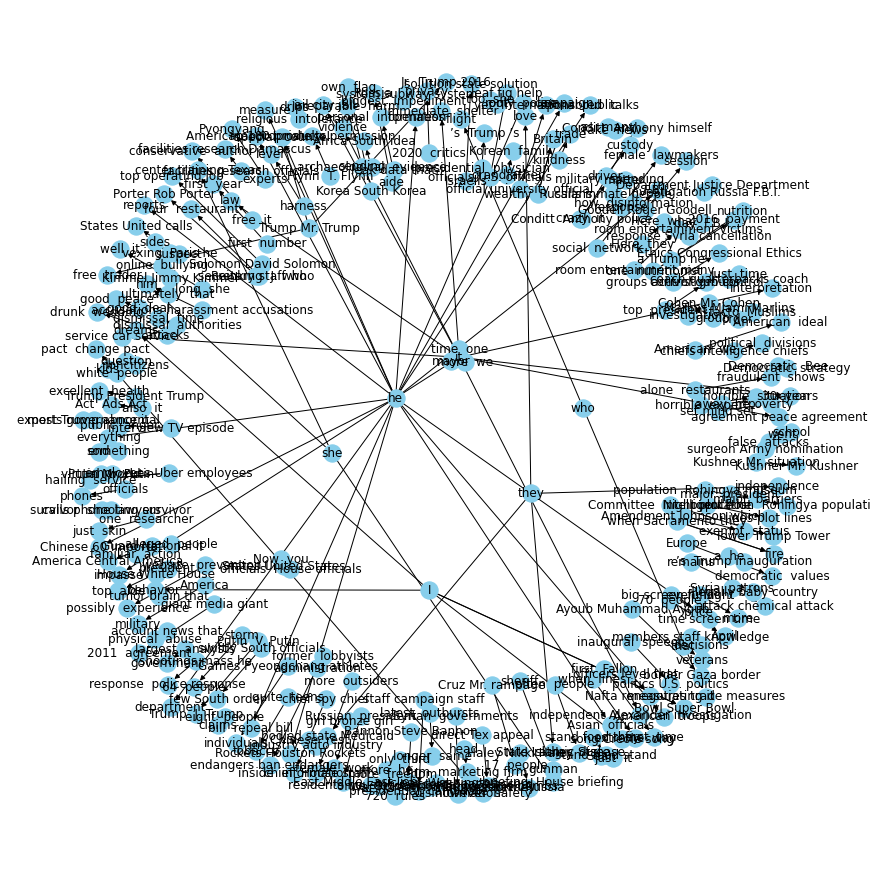

In [139]:
plt.figure(figsize=(12,12))
pos = nx.spring_layout(G)
G=nx.from_pandas_edgelist(graph_df_e[graph_df_e['edge']=='said'], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

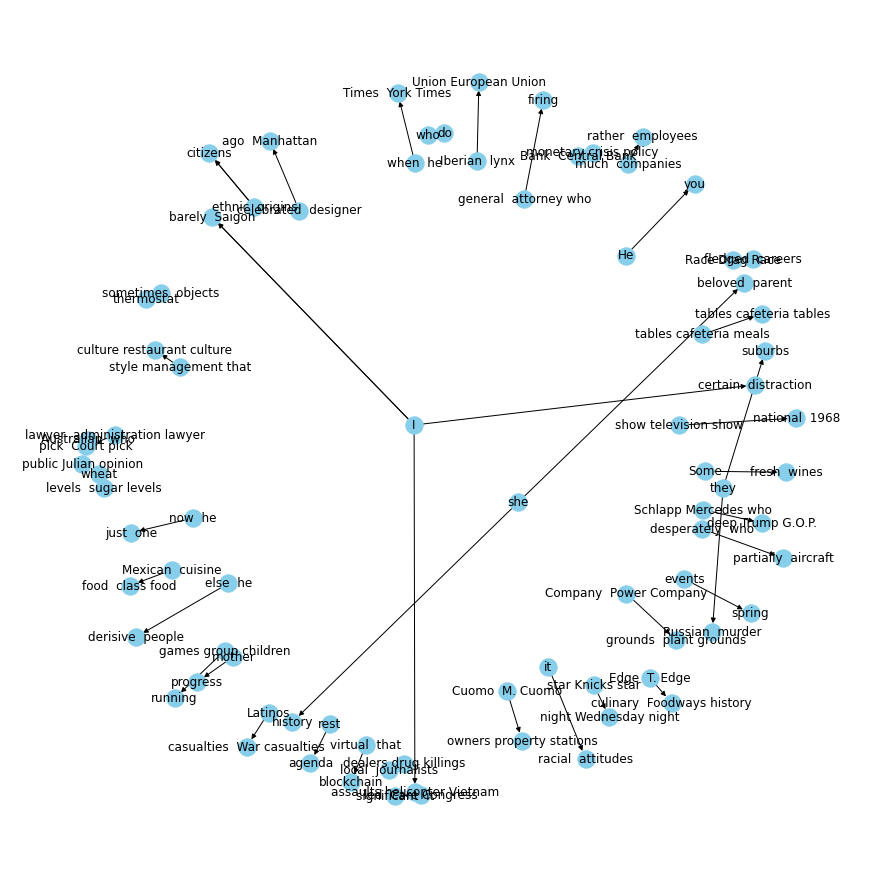

In [141]:
plt.figure(figsize=(12,12))
pos = nx.spring_layout(G)
G=nx.from_pandas_edgelist(graph_df_e[graph_df_e['edge']=='made'], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()